# Edge collapse - visual proof

**when we draw `B` rollouts from the *same* context, do they look different?**

In [29]:
%load_ext autoreload
%autoreload 2
import sys, math, time
import numpy as np
import torch
import matplotlib.pyplot as plt
import mediapy
import cv2
from torch.nn.functional import interpolate

sys.path.insert(0, '../../..')             # repo root

torch.manual_seed(0)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
resolution = (256, 256)
print('device:', device)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
device: cuda:0


In [30]:
from hydra import initialize_config_dir, compose
from dreamerv4uwm.models.utils import load_tokenizer, load_denoiser
from dreamerv4uwm.datasets import ShardedHDF5Dataset
from dreamerv4uwm.planning import rollout_new as R
# from dreamerv4uwm.planning import rollout_stoch as RS

CFG_DIR  = '/home/mim-server/projects/felix/dreamerV4-UWM/scripts/config'
# DYN_CKPT = '/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/blockcausal/pushT-post-train/97500.pt'
DYN_CKPT = '/home/mim-server/projects/felix/checkpoints/wamcl-pushT-15k.pt'
TOK_CKPT = '/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/tokenizer/pushT.pt'
DATA_PATH = '/home/mim-server/datasets/pushT/h5/play'

with initialize_config_dir(version_base=None, config_dir=CFG_DIR):
    cfg = compose(config_name='dynamics/pushT-large', overrides=['denoiser.horizon_aware=false'])
cfg.dynamics_ckpt, cfg.tokenizer_ckpt = DYN_CKPT, TOK_CKPT
denoiser  = load_denoiser(cfg, device, max_num_forward_steps=300).eval().to(device)
tokenizer = load_tokenizer(cfg, device, max_num_forward_steps=300).eval().to(device)
print('n_actions:', cfg.denoiser.n_actions)

n_actions: 2


## Display helpers

In [31]:
@torch.no_grad()
def decode(lat):
    """Latents (B,T,N,D) -> video (B,T,3,H,W) float[0,1] (bf16 autocast)."""
    with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        v = tokenizer.decode(lat.to(device))
    return v.float().clamp(0, 1)

def frame_rgb(lat_1frame):
    """(1,1,N,D) latent -> (H,W,3) uint8 RGB."""
    v = decode(lat_1frame)[0, 0]
    return (v.permute(1, 2, 0).clamp(0, 1) * 255).to(torch.uint8).cpu().numpy()

def _strip(video_tchw, n_frames=8, border=2):
    """(T,C,H,W) -> one (H,W,C) uint8 filmstrip, frames evenly spaced, white separators."""
    T = video_tchw.shape[0]
    idx = np.linspace(0, T - 1, min(n_frames, T), dtype=int)
    fr = (video_tchw[idx].cpu().permute(0, 2, 3, 1).float().numpy() * 255).clip(0, 255).astype(np.uint8)
    H, W, C = fr.shape[1:]
    sep = np.full((H, border, C), 255, np.uint8)
    parts = []
    for i, f in enumerate(fr):
        if i:
            parts.append(sep)
        parts.append(f)
    return np.concatenate(parts, axis=1)

def plotComparison(named_videos, n_frames=8, title=None):
    """Stack labeled (T,C,H,W) clips as filmstrip rows (one row per clip)."""
    rows = [(lab, _strip(v, n_frames)) for lab, v in named_videos]
    fig, axes = plt.subplots(len(rows), 1, figsize=(n_frames * 2, 2.0 * len(rows)))
    if len(rows) == 1:
        axes = [axes]
    for ax, (lab, img) in zip(axes, rows):
        ax.imshow(img); ax.set_xticks([]); ax.set_yticks([])
        ax.set_ylabel(lab, rotation=0, ha='right', va='center', fontsize=10)
    if title:
        axes[0].set_title(title, fontsize=12)
    plt.tight_layout(); plt.show()

def plotVideo(video, fps=10):
    """Play a (T,C,H,W) float[0,1] clip inline, with frame numbers burned in."""
    arr = (video.cpu().permute(0, 2, 3, 1).to(torch.float32).numpy() * 255).clip(0, 255).astype(np.uint8)
    for i in range(arr.shape[0]):
        cv2.putText(arr[i], f'Frame {i}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
    mediapy.show_video(arr, fps=fps)

def get_window(idx):
    batch = dataset[idx]
    imgs = interpolate(batch['image'], resolution).to(device)[None]
    actions = batch['action'][:, :cfg.denoiser.n_actions][None].to(device)
    with torch.no_grad(), torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        latents = tokenizer.encode(imgs).float()
    return imgs, actions, latents

## The context

Train split: 64694 windows from 11 episodes
dataset size: 64694


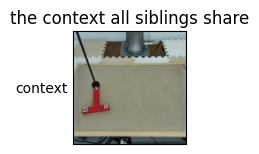

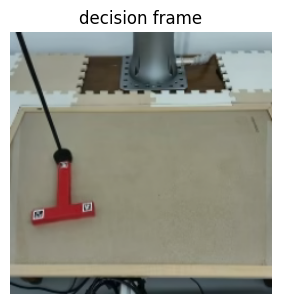

In [32]:
dataset = ShardedHDF5Dataset(data_dir=DATA_PATH, window_size=64, stride=1, split='train',
                             train_fraction=0.9, split_seed=123, shuffle_windows=False)
print('dataset size:', len(dataset))

WINDOW_SEED = 1234
T0     = 50        # decision at frame T0 + T_CTX
T_CTX  = 1         # context frames
B      = 6         # siblings drawn from this one context
H      = 16        # edge horizon (frames per rollout)
K      = 10         # Euler steps

imgs, actions, latents = get_window(WINDOW_SEED)
cz = latents[:, T0:T0 + T_CTX].clone()      # (1,Tc,N,D)
ca = actions[:, T0:T0 + T_CTX].clone()      # (1,Tc,n_act)

plotComparison([('context', decode(cz)[0])], n_frames=T_CTX, title='the context all siblings share')
plt.figure(figsize=(3.4, 3.4))
plt.imshow(frame_rgb(cz[:, -1:])); plt.axis('off'); plt.title('decision frame'); plt.show()

## Sampling helper

In [33]:
@torch.no_grad()
def sample_siblings_imagine(seed=0, churn=0.0, uncond=False, **kw):
    """B rollouts from the SAME context. Returns (videos (B,H,3,h,w), z (B,H,N,D), a (B,H,n_act)).

    `uncond=True` drops the context entirely (`ctx_z = ctx_a = None`): the model samples from
    its own prior over trajectories rather than the posterior given `cz, ca`. Nothing else
    changes — same sampler, same `B`, same `K` — so it stays comparable with every row below,
    and it is the diversity *ceiling* they are all competing against (View 8).
    """
    g = torch.Generator(device=device).manual_seed(seed)
    c_z, c_a = (None, None) if uncond else (cz, ca)
    z, a = R.imagine(denoiser, c_z, c_a, H, B=B, K=K, device=device, generator=g, **kw)
    return decode(z), z, a

t = time.time()
vid, z0, a0 = sample_siblings_imagine(seed=0)
print(f'{B} siblings, H={H} frames, in {time.time()-t:.1f}s | videos {tuple(vid.shape)}')

6 siblings, H=16 frames, in 2.3s | videos (6, 16, 3, 256, 256)


### joint-denosing study

## View 1: the siblings, one row each

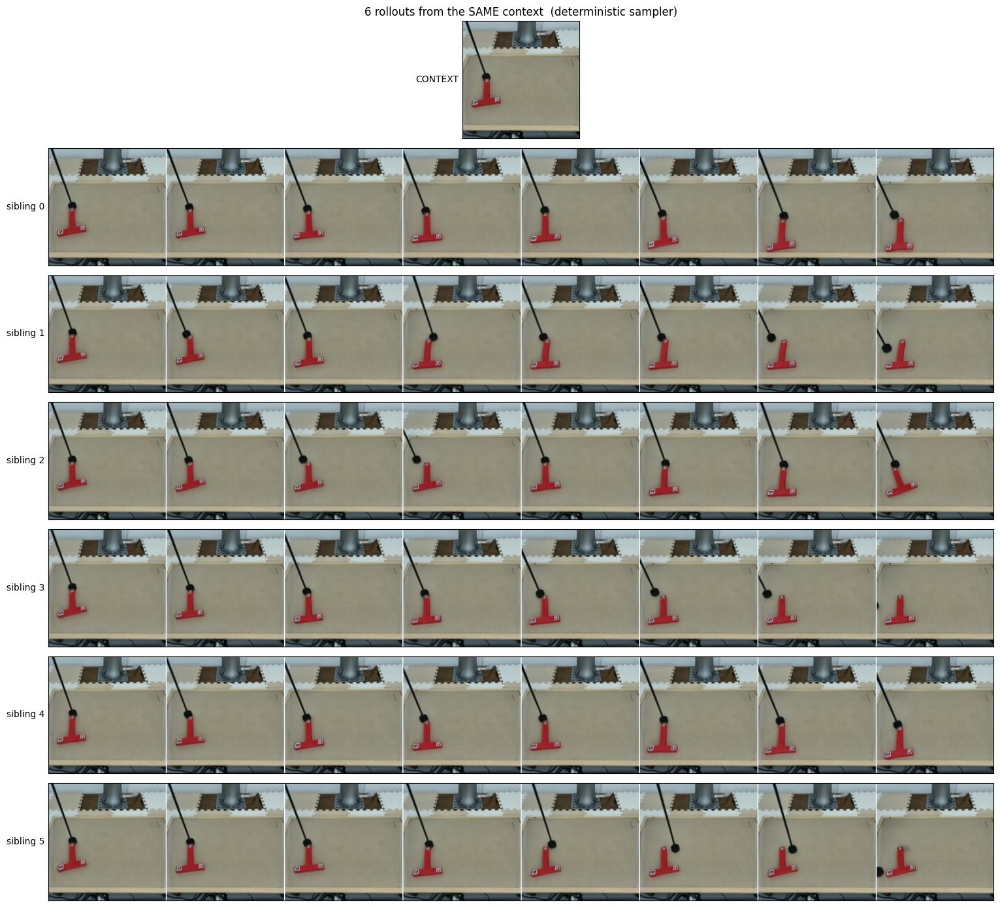

In [34]:
plotComparison([('CONTEXT', decode(cz)[0])] + [(f'sibling {b}', vid[b]) for b in range(B)],
               n_frames=8, title=f'{B} rollouts from the SAME context  (deterministic sampler)')

## View 2: the terminal frames

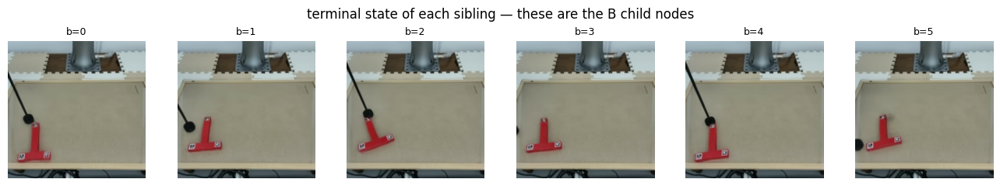

In [35]:
def plotTerminals(vid, title=None, ncol=None):
    """Grid of the last frame of each sibling video (B,T,3,h,w)."""
    B_ = vid.shape[0]
    ncol = ncol or B_
    nrow = math.ceil(B_ / ncol)
    fig, axes = plt.subplots(nrow, ncol, figsize=(2.2 * ncol, 2.4 * nrow), squeeze=False)
    for i, ax in enumerate(axes.flat):
        if i < B_:
            ax.imshow(vid[i, -1].permute(1, 2, 0).cpu().numpy())
            ax.set_title(f'b={i}', fontsize=9)
        ax.axis('off')
    if title:
        fig.suptitle(title, fontsize=12)
    plt.tight_layout(); plt.show()

plotTerminals(vid, title='terminal state of each sibling — these are the B child nodes')

## View 3: play them side by side

In [36]:
def plotSiblingVideos(vid, fps=8, columns=3):
    """Tile the B sibling clips into one inline video grid."""
    arrs = {}
    for b in range(vid.shape[0]):
        a_ = (vid[b].cpu().permute(0, 2, 3, 1).float().numpy() * 255).clip(0, 255).astype(np.uint8)
        arrs[f'b={b}'] = a_
    mediapy.show_videos(arrs, fps=fps, columns=columns, height=200)

plotSiblingVideos(vid)

## View 4: the action paths

pushT actions are 2-D, so the `B` sampled action sequences can be drawn directly. Grey is the
real context trajectory that led here; each colour is one sibling's imagined continuation.

**This is the cleanest visual of collapse**: if the coloured paths lie on top of one another,
the policy sampled the same action sequence `B` times.

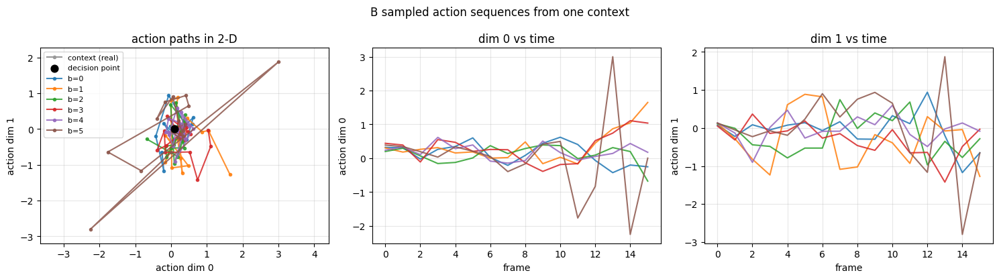

In [37]:
def plotActionPaths(a, ca=None, title=None):
    """Overlay the B action sequences (B,H,2); grey = context actions (1,Tc,2)."""
    a_np = a.float().cpu().numpy()
    fig, ax = plt.subplots(1, 3, figsize=(15, 4.2))

    if ca is not None:
        c = ca[0].float().cpu().numpy()
        ax[0].plot(c[:, 0], c[:, 1], '-o', c='0.6', ms=3, lw=1.5, label='context (real)')
        ax[0].scatter(c[-1, 0], c[-1, 1], c='k', s=60, zorder=5, label='decision point')
    for b in range(a_np.shape[0]):
        ax[0].plot(a_np[b, :, 0], a_np[b, :, 1], '-o', ms=3, alpha=.85, label=f'b={b}')
        ax[1].plot(a_np[b, :, 0], alpha=.85)
        ax[2].plot(a_np[b, :, 1], alpha=.85)
    ax[0].set(xlabel='action dim 0', ylabel='action dim 1', title='action paths in 2-D')
    ax[0].legend(fontsize=8); ax[0].grid(alpha=.3); ax[0].set_aspect('equal', 'datalim')
    ax[1].set(xlabel='frame', ylabel='action dim 0', title='dim 0 vs time'); ax[1].grid(alpha=.3)
    ax[2].set(xlabel='frame', ylabel='action dim 1', title='dim 1 vs time'); ax[2].grid(alpha=.3)
    if title:
        fig.suptitle(title, fontsize=12)
    plt.tight_layout(); plt.show()

plotActionPaths(a0, ca, title='B sampled action sequences from one context')

## View 6: knob

Same context, same seed, same budget (`K` denoiser steps everywhere) — only the sampler
setting changes. One row per setting, showing that setting's `B` terminal frames.

* `ctx_noise` / `action_temp` are the **existing** knobs. They work, but buy diversity by
  pushing the model off-distribution (planning from a state that is not the real one, or
  sampling from a prior the model never saw).
* `churn` is the new one (`rollout_stoch.py`): it re-samples the noise *during* integration,
  which leaves the target distribution untouched. `churn=0` is exactly the deterministic
  sampler.
* `NO CONTEXT`: the same sampler with nothing to condition on
  (`ctx_z = ctx_a = None`). Conditioning can only narrow a distribution, so this row bounds
  what every other row can achieve. It is also the one row whose frames have no reason to
  resemble the context — judge it on spread, not on agreement with the decision frame.

In [38]:
SETTINGS = [
    ('deterministic',      dict()),
    # ('churn=0.3',          dict(churn=0.3)),
    # ('churn=0.6',          dict(churn=0.6)),
    # ('churn=0.6 orth',     dict(churn=0.6, churn_orthogonal=True)),
    ('ctx_noise=0.5',      dict(ctx_noise=0.5)),
    ('action_temp=1.5',    dict(action_temp=1.5)),
    ('NO CONTEXT',         dict(uncond=True)),      # the ceiling, not a knob — see View 8
]

results = {}
for name, kw in SETTINGS:
    t = time.time()
    results[name] = sample_siblings_imagine(seed=0, **kw)
    print(f'{name:<20} {time.time()-t:5.1f}s')

deterministic          2.2s
ctx_noise=0.5          2.5s
action_temp=1.5        2.5s
NO CONTEXT             2.4s


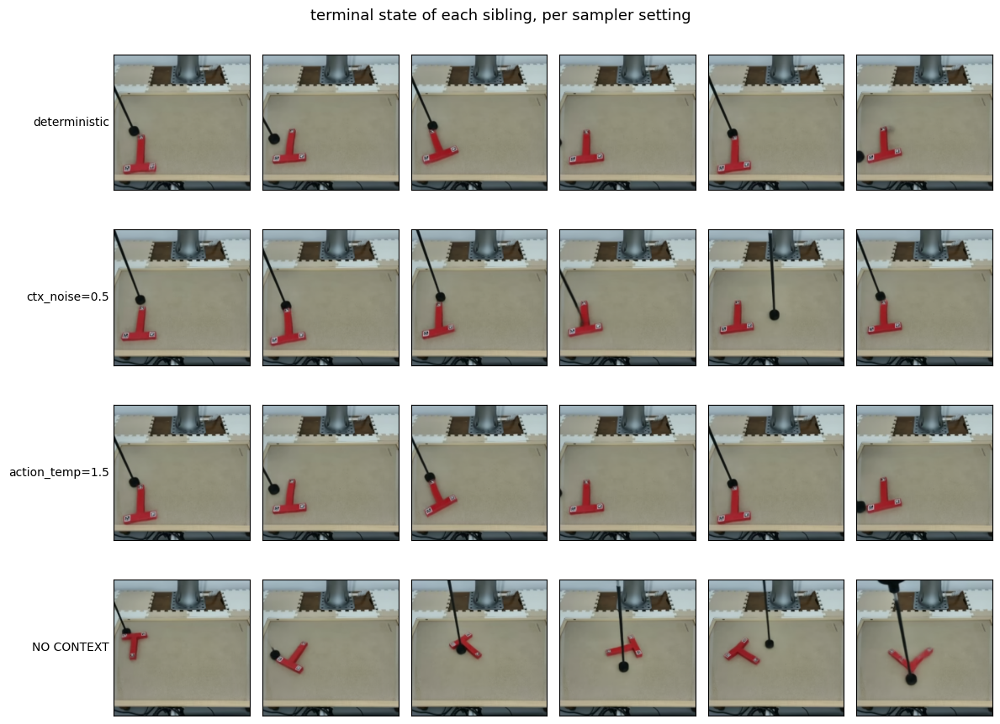

In [39]:
# one row per setting, the B terminal frames in that row
fig, axes = plt.subplots(len(SETTINGS), B, figsize=(2.0 * B, 2.25 * len(SETTINGS)))
for r, (name, _) in enumerate(SETTINGS):
    v = results[name][0]
    for b in range(B):
        axes[r, b].imshow(v[b, -1].permute(1, 2, 0).cpu().numpy())
        axes[r, b].set_xticks([]); axes[r, b].set_yticks([])
    axes[r, 0].set_ylabel(name, rotation=0, ha='right', va='center', fontsize=10)
fig.suptitle('terminal state of each sibling, per sampler setting', fontsize=13)
plt.tight_layout(); plt.show()

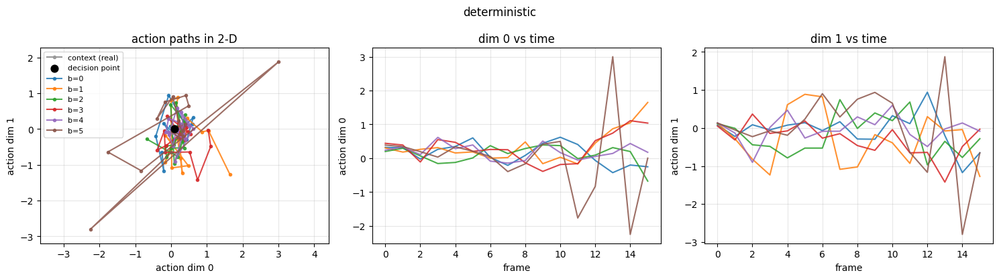

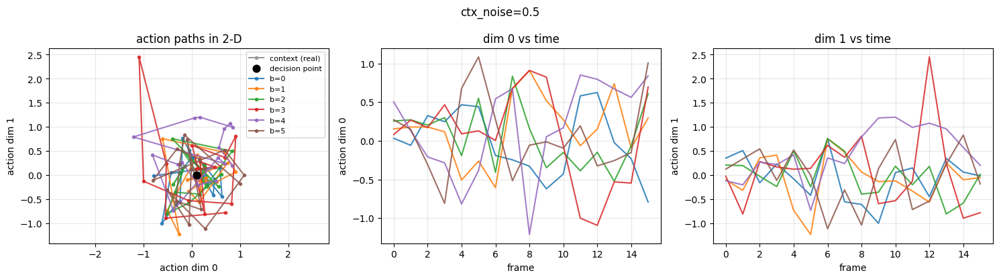

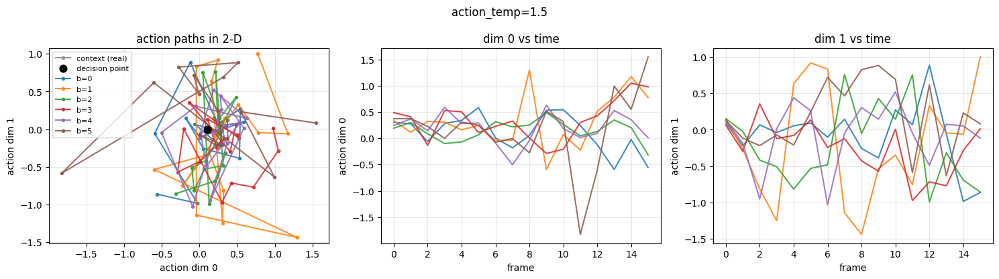

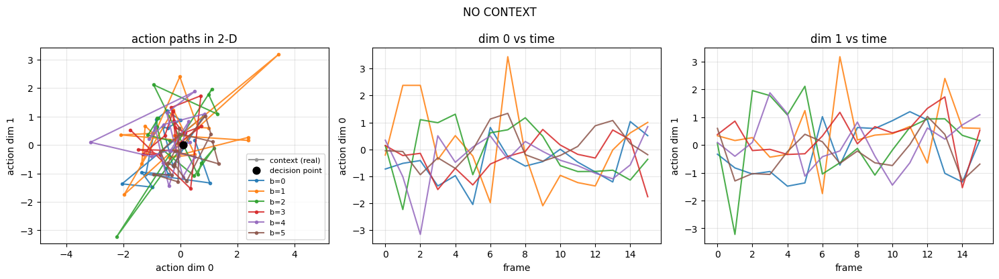

In [40]:
# and the action paths per setting
for name, _ in SETTINGS:
    plotActionPaths(results[name][2], ca, title=name)

## View 7: drill into one setting

Set `PICK` to whichever row above looked most promising and re-run the full set of views on it.

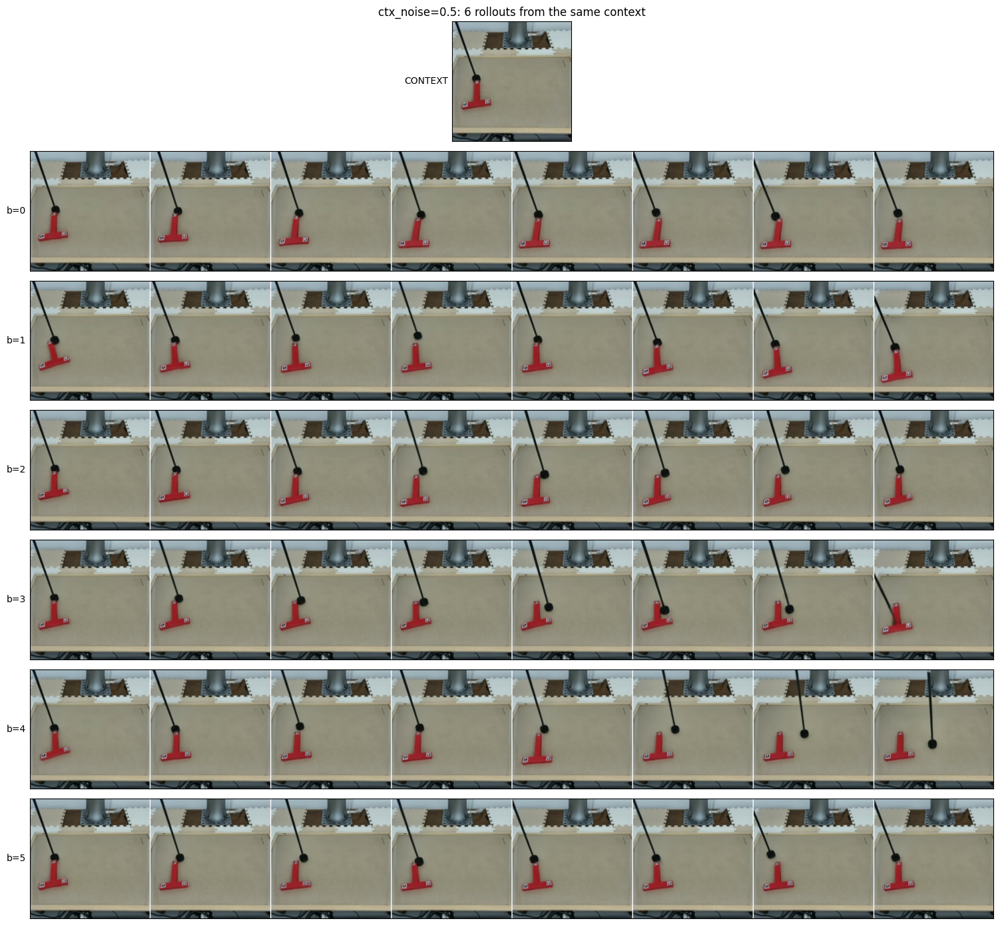

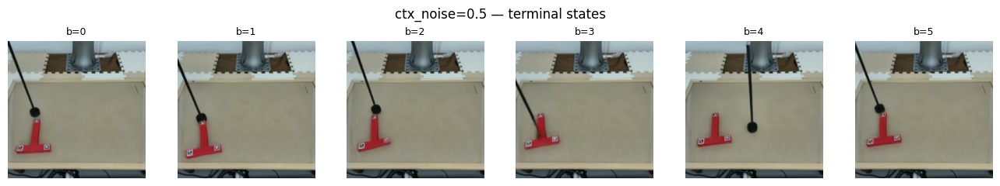

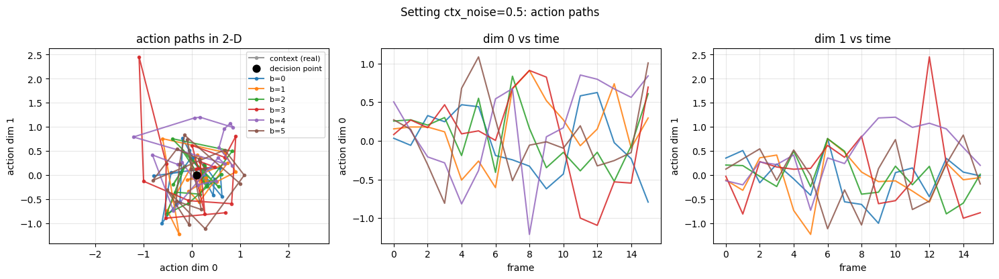

In [41]:
PICK = 'ctx_noise=0.5'

v, z, a = results[PICK]
plotComparison([('CONTEXT', decode(cz)[0])] + [(f'b={b}', v[b]) for b in range(B)],
               n_frames=8, title=f'{PICK}: {B} rollouts from the same context')
plotTerminals(v, title=f'{PICK} — terminal states')
plotSiblingVideos(v)
plotActionPaths(a, ca, title=f'Setting {PICK}: action paths')

## View 8: generating with no context at all

`ctx_z = ctx_a = None`: the model samples from its own prior over
pushT episodes. Beware `device=`.

Conditioning can only narrow a distribution. The spread of these unconditional samples is therefore the most this sampler.
Two diagnosis:

* **Unconditional siblings also collapse**: the *sampler* is contractive. The problem is the
  deterministic ODE integration, not the context, and no amount of conditioning-side
  tinkering (`ctx_noise`, shorter context, a different decision frame) will fix it. Churn and
  friends are the right place to look.
* **Unconditional siblings spread widely, conditioned ones do not**: the model knows how to
  be diverse and the *conditioning* is what pins it down. Then the question becomes whether
  that is correct behaviour (this context genuinely admits one continuation) or over-reliance
  on context, and `ctx_noise` becomes the relevant knob after all.

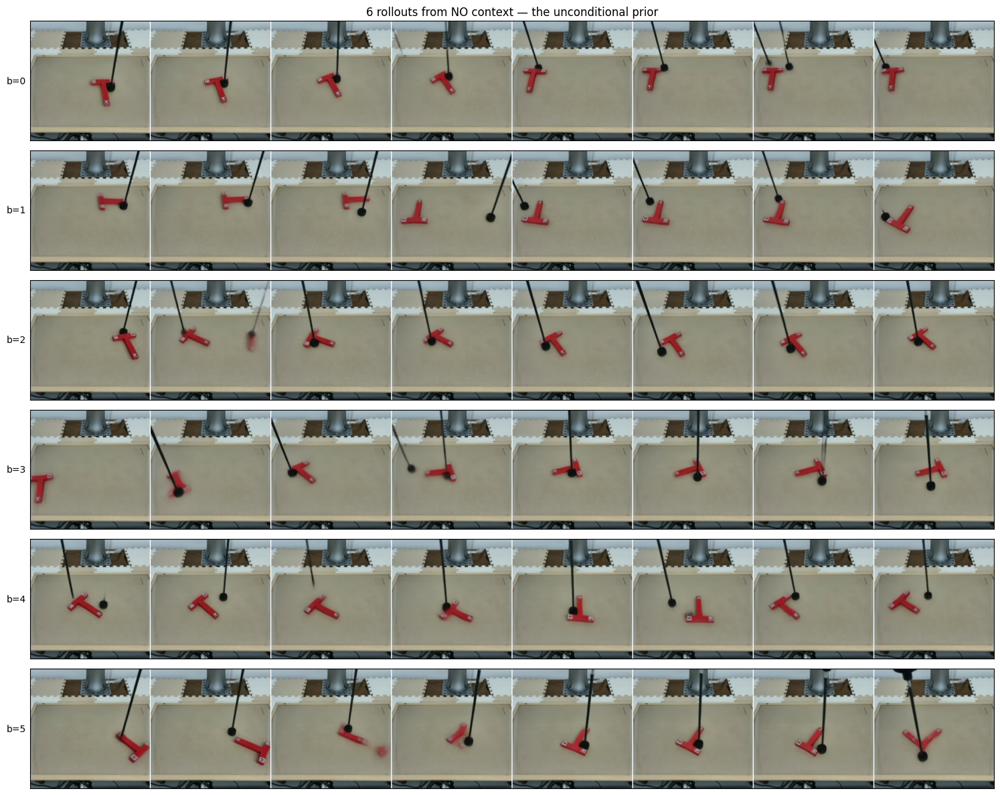

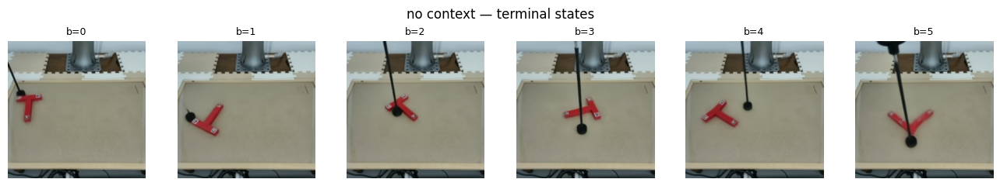

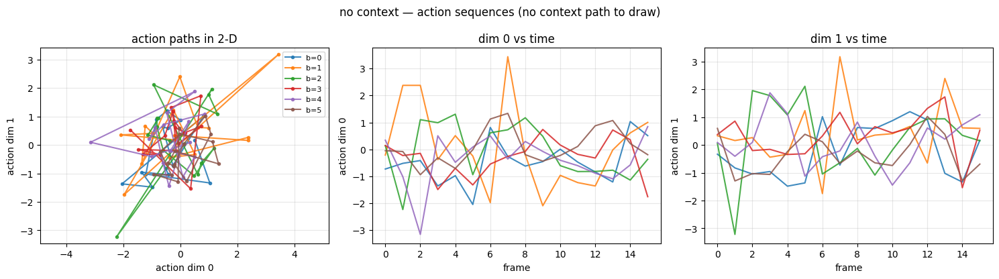

In [42]:
vid_u, z_u, a_u = sample_siblings_imagine(seed=0, uncond=True)

plotComparison([(f'b={b}', vid_u[b]) for b in range(B)], n_frames=8,
               title=f'{B} rollouts from NO context — the unconditional prior')
plotTerminals(vid_u, title='no context — terminal states')
plotSiblingVideos(vid_u)
plotActionPaths(a_u, None, title='no context — action sequences (no context path to draw)')
# plotSpread(vid_u, title='no context — sibling disagreement (the ceiling)')